## Philipp Panzenböck

#### The following codes show data query, data processing and data visualization with different visualization methods.

#### Importing modules

In [1]:
#Importing the relevant modules
import requests
import io
from bs4 import BeautifulSoup
import pandas as pd
import numpy as np
import matplotlib as mpl

from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")

from wordcloud import (WordCloud, get_single_color_func)

import seaborn as sns
import matplotlib.pyplot as plt

import squarify

from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

import plotly.express as px

import os
import sys
import mpl_chord_diagram as mpl_cd
from mpl_chord_diagram import chord_diagram

from IPython.display import display, Image

#### Data query from SDWs

Title: Loans vis-a-vis euro area insurance corporations & pension funds reported by MFI in the euro area (stock)    
Key: BSI.M.U2.Y.U.A20.A.1.U2.2220.Z01.E

* Frequency: M (Monthly)
* Reference area: U2 (Euro area)
* Adjustment indicator: Y (Workingday and seasonal adjusted)
* Balance sheet item: A20 (Loans)
* Original maturity: A (Total)
* Data type: 1 (Outstanding amount at the end of the period (stocks))
* Counterpart area: U2 (Euro area)
* Currency of transaction: Z01 (All currencies combined)
* Balance sheet suffic: E (Euro)

Link: https://sdw.ecb.europa.eu/browse.do?org.apache.struts.taglib.html.TOKEN=e3a4f40376d77e3d663e01a57c5e25bc&df=true&ec=&dc=&oc=&pb=&rc=&DATASET=0&removeItem=&removedItemList=&mergeFilter=&activeTab=BSI&showHide=&BS_ITEM.14=A20&MATURITY_ORIG.14=A&DATA_TYPE.14=1&MAX_DOWNLOAD_SERIES=500&SERIES_MAX_NUM=50&node=bbn3490&legendRef=reference&legendPub=published&ajaxTab=true

_Source: https://www.pythonsherpa.com/static/files/html/ECB%20-%20Open%20Data.html (customized)_

In [2]:
# Building blocks for the URL
entrypoint = 'https://sdw-wsrest.ecb.europa.eu/service/'
resource = 'data'
flowRef ='BSI'
key = 'M.U2.Y.U.A20.A.1.U2.2220.Z01.E'

parameters = {
    'startPeriod': '2018-01-31',
    'endPeriod':   '2022-06-30'
}

In [3]:
# Construct the URL: https://sdw-wsrest.ecb.europa.eu/service/data/EXR/D.CHF.EUR.SP00.A
request_url = entrypoint + resource + '/'+ flowRef + '/' + key
# Make the HTTP request
response = requests.get(request_url, params=parameters)
# Make the HTTP request again, now requesting for CSV format
response = requests.get(request_url, params=parameters, headers={'Accept': 'text/csv'})
# Read the response as a file into a Pandas DataFrame
df = pd.read_csv(io.StringIO(response.text))

In [4]:
df.head(3)

,KEY,FREQ,REF_AREA,ADJUSTMENT,BS_REP_SECTOR,BS_ITEM,MATURITY_ORIG,DATA_TYPE,COUNT_AREA,BS_COUNT_SECTOR,...,PUBL_PUBLIC,UNIT_INDEX_BASE,COMPILATION,DECIMALS,NAT_TITLE,SOURCE_AGENCY,TITLE,TITLE_COMPL,UNIT,UNIT_MULT
0,BSI.M.U2.Y.U.A20.A.1.U2.2220.Z01.E,M,U2,Y,U,A20,A,1,U2,2220,...,NaN,NaN,NaN,0,NaN,NaN,Loans vis-a-vis euro area insurance corporatio...,"Euro area (changing composition), Outstanding ...",EUR,6
1,BSI.M.U2.Y.U.A20.A.1.U2.2220.Z01.E,M,U2,Y,U,A20,A,1,U2,2220,...,NaN,NaN,NaN,0,NaN,NaN,Loans vis-a-vis euro area insurance corporatio...,"Euro area (changing composition), Outstanding ...",EUR,6
2,BSI.M.U2.Y.U.A20.A.1.U2.2220.Z01.E,M,U2,Y,U,A20,A,1,U2,2220,...,NaN,NaN,NaN,0,NaN,NaN,Loans vis-a-vis euro area insurance corporatio...,"Euro area (changing composition), Outstanding ...",EUR,6


In [5]:
# Create a new DataFrame
df = df.filter(['TIME_PERIOD', 'OBS_VALUE'], axis=1)
df['TIME_PERIOD'] = pd.to_datetime(df['TIME_PERIOD'])
df = df.set_index('TIME_PERIOD')
df.tail()

,OBS_VALUE
TIME_PERIOD,
2022-01-01,172752
2022-02-01,170151
2022-03-01,153048
2022-04-01,160776
2022-05-01,160180


#### Defining parameters for the following charts

In [6]:
height = 6
wide = 14
lineplot_color = 'black'
titel_fontsize = 18
title_distance = 10
labels_fontsize = 16
legend_fontsize = 13
save_dpi = 300

### Lineplot

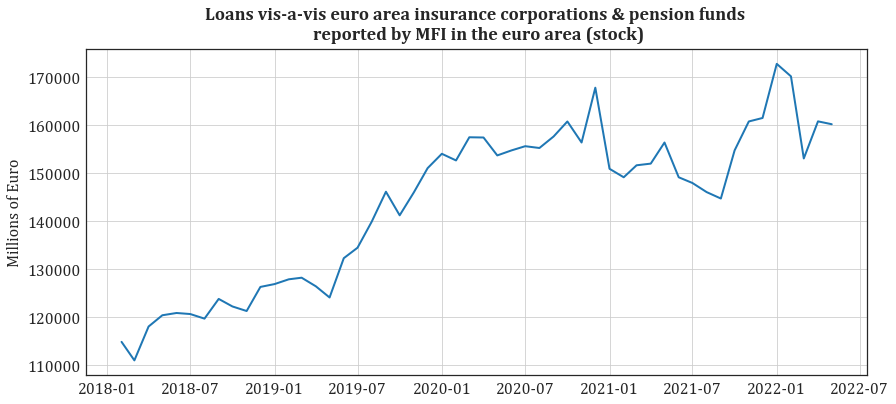

In [7]:
plt.style.use(['seaborn-white', 'seaborn-paper'])
plt.rc("font", family="Cambria")

plt.figure(figsize=(wide, height))
plt.plot(df, linewidth=2)
plt.ylabel(ylabel = "Millions of Euro", size=labels_fontsize)
plt.xticks(fontsize=labels_fontsize)
plt.yticks(fontsize=labels_fontsize)
plt.title("Loans vis-a-vis euro area insurance corporations & pension funds \n reported by MFI in the euro area (stock)", fontweight="bold", size=titel_fontsize, pad=title_distance)
plt.grid(all)
plt.savefig(f'Chart_1.png', dpi=save_dpi, bbox_inches='tight')

#### Color scheme definition

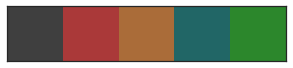

In [8]:
def get_colors2():
    return np.array([
        [0.25, 0.25, 0.25],        # very dark gray
        [0.667, 0.224, 0.224],     # red A13646
        [0.667, 0.424, 0.224],     # brown AA6439
        [0.131, 0.400, 0.400],     # blue 256E5D
        [0.176, 0.533, 0.176]      # green 4B9130
    ]) 
sns.palplot(get_colors2())

### Query of further data from the SDW

In [9]:
# Building blocks for the URL
entrypoint = 'https://sdw-wsrest.ecb.europa.eu/service/'
resource = 'data'
flowRef ='BSI'
# Loans vis-a-vis euro area NFC reported by MFI in the euro area (stock)
keys = ['M.U2.Y.U.A20.F.1.U2.2240.Z01.E',  # Up to 1 year
        'M.U2.Y.U.A20.I.1.U2.2240.Z01.E',  # Over 1 and up to 5 years
        'M.U2.Y.U.A20.J.1.U2.2240.Z01.E'   # Over 5 years
       ]

parameters = {
    'startPeriod': '2018-01-31',
    'endPeriod':   '2022-06-30'
}

In [10]:
i = 0
maturiy = ["F","I","J"]
for key in keys:
    print(f'{key} stored in df_BSI_{maturiy[i]}')
    # Construct the URL: https://sdw-wsrest.ecb.europa.eu/service/data/EXR/D.CHF.EUR.SP00.A
    request_url = entrypoint + resource + '/'+ flowRef + '/' + key
    # Make the HTTP request
    response = requests.get(request_url, params=parameters)
    # Make the HTTP request again, now requesting for CSV format
    response = requests.get(request_url, params=parameters, headers={'Accept': 'text/csv'})
    # Read the response as a file into a Pandas DataFrame
    df = pd.read_csv(io.StringIO(response.text))
    
    df = df.filter(['TIME_PERIOD', 'OBS_VALUE'], axis=1)
    df['TIME_PERIOD'] = pd.to_datetime(df['TIME_PERIOD'])
    df = df.set_index('TIME_PERIOD')
    
    # storing in dynamic dataframes
    exec(f'df_BSI_{maturiy[i]}= df.copy()')
    i = i + 1

M.U2.Y.U.A20.F.1.U2.2240.Z01.E stored in df_BSI_F
M.U2.Y.U.A20.I.1.U2.2240.Z01.E stored in df_BSI_I
M.U2.Y.U.A20.J.1.U2.2240.Z01.E stored in df_BSI_J


In [11]:
df_BSI_F = df_BSI_F.rename(columns={"OBS_VALUE": "Up to 1 year (F)"})
df_BSI_I = df_BSI_I.rename(columns={"OBS_VALUE": "Over 1 and up to 5 years (I)"})
df_BSI_J = df_BSI_J.rename(columns={"OBS_VALUE": "Over 5 years (J)"})

In [12]:
df_BSI_merged = pd.merge(df_BSI_F, df_BSI_I, left_index=True, right_index=True)
df_BSI_merged = pd.merge(df_BSI_merged, df_BSI_J, left_index=True, right_index=True)

In [13]:
df_BSI_merged.head(3)

,Up to 1 year (F),Over 1 and up to 5 years (I),Over 5 years (J)
TIME_PERIOD,,,
2018-02-01,991796,823704,2534634
2018-03-01,999959,822194,2524270
2018-04-01,1001986,823826,2531302


### Lineplot (multiple lines)

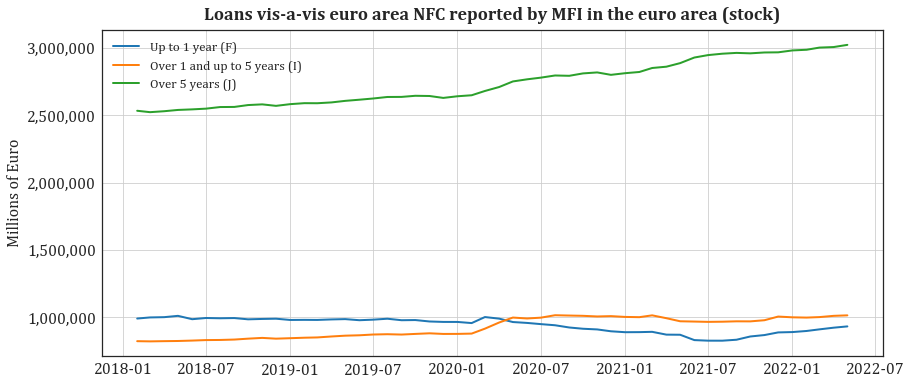

In [14]:
plt.style.use(['seaborn-white'])
plt.rc("font", family="Cambria")

fig, ax = plt.subplots(figsize = (wide,height))
ax.plot(df_BSI_merged, linewidth=2)
ax.get_yaxis().set_major_formatter(
    mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

ax.legend(list(df_BSI_merged.columns), fontsize=legend_fontsize)
ax.set_ylabel("Millions of Euro", fontsize=labels_fontsize)
ax.tick_params(labelsize=labels_fontsize)
ax.set_title("Loans vis-a-vis euro area NFC reported by MFI in the euro area (stock)", fontweight="bold", size=titel_fontsize, pad=title_distance)
ax.grid(all)
fig.savefig(f'Chart_2.png', dpi=save_dpi, bbox_inches='tight')

### Boxplot

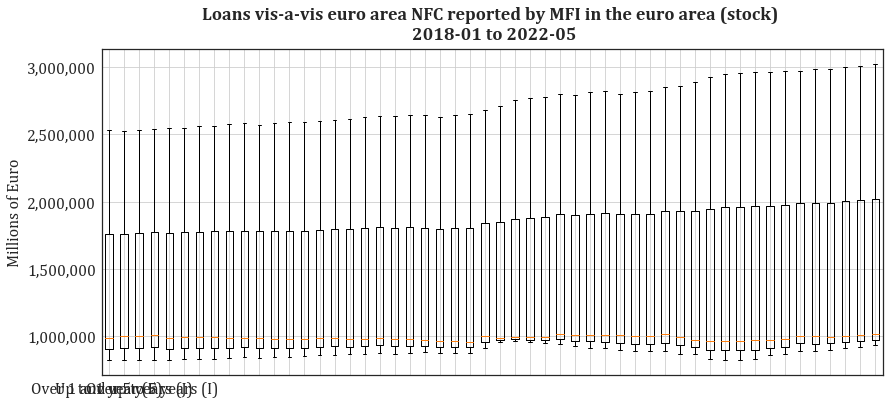

In [15]:
plt.style.use(['seaborn-white'])
plt.rc("font", family="Cambria")

fig, ax = plt.subplots(figsize = (wide,height))
ax.get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax.boxplot(df_BSI_merged.reset_index().drop("TIME_PERIOD", axis=1))
ax.set_ylabel("Millions of Euro", fontsize=labels_fontsize)
ax.tick_params(labelsize=labels_fontsize)
ax.set_xticklabels(list(df_BSI_merged.columns))
ax.set_title("Loans vis-a-vis euro area NFC reported by MFI in the euro area (stock) \n 2018-01 to 2022-05", fontweight="bold", size=titel_fontsize, pad=title_distance)
ax.grid(all)
fig.savefig(f'Chart_3.png', dpi=save_dpi, bbox_inches='tight')

### Barplot (multiple bars)

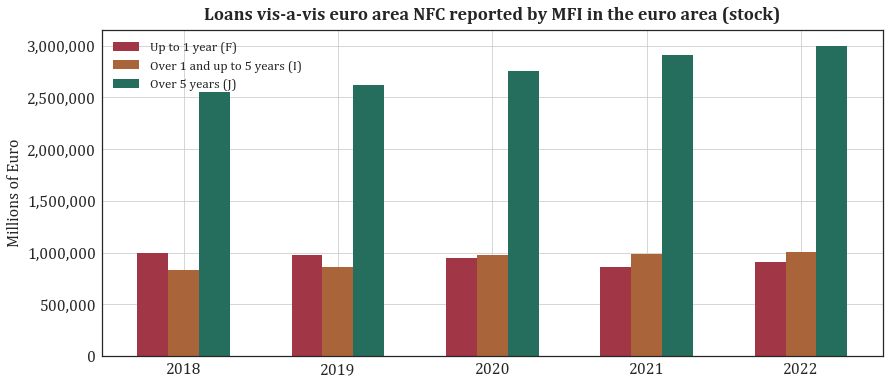

In [16]:
plt.style.use(['seaborn-white'])
plt.rc("font", family="Cambria")

fig, ax = plt.subplots(figsize = (wide,height))
ax.bar(df_BSI_merged.resample('Y').mean().index.year-0.2, df_BSI_merged.resample('Y').mean()[df_BSI_merged.columns[0]], width = 0.2, color='#A13646')
ax.bar(df_BSI_merged.resample('Y').mean().index.year, df_BSI_merged.resample('Y').mean()[df_BSI_merged.columns[1]], width = 0.2, color='#AA6439')
ax.bar(df_BSI_merged.resample('Y').mean().index.year+0.2, df_BSI_merged.resample('Y').mean()[df_BSI_merged.columns[2]], width = 0.2, color='#256E5D')
ax.get_yaxis().set_major_formatter(
    mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

ax.legend(list(df_BSI_merged.resample('Y').sum().columns), fontsize=legend_fontsize)
ax.set_ylabel("Millions of Euro", fontsize=labels_fontsize)
ax.tick_params(labelsize=labels_fontsize)
ax.set_title("Loans vis-a-vis euro area NFC reported by MFI in the euro area (stock)", fontweight="bold", size=titel_fontsize, pad=title_distance)
ax.grid(all)
fig.savefig(f'Chart_4.png', dpi=save_dpi, bbox_inches='tight')

### Stacked area chart

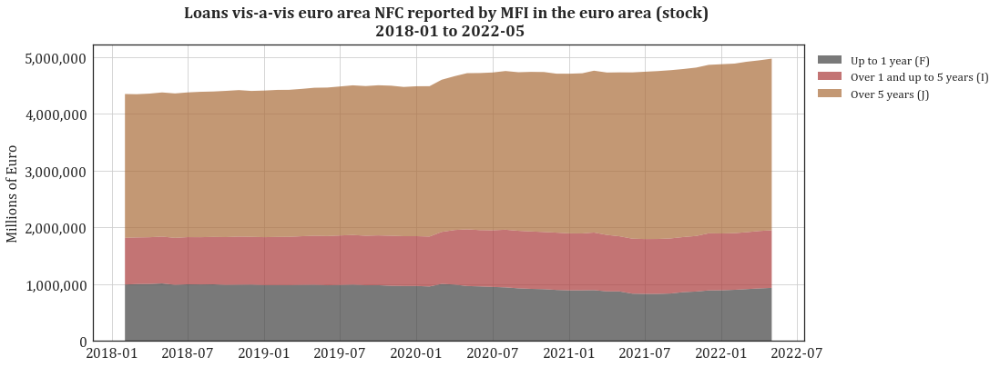

In [17]:
plt.style.use(['seaborn-white'])
plt.rc("font", family="Cambria")

fig, ax = plt.subplots(figsize = (wide,height))
ax.get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

ax.stackplot(df_BSI_merged.index,
                  df_BSI_merged[df_BSI_merged.columns[0]],
                  df_BSI_merged[df_BSI_merged.columns[1]],
                  df_BSI_merged[df_BSI_merged.columns[2]],              
                  labels=list(df_BSI_merged.columns), colors=get_colors2(), alpha=0.7)
ax.legend(list(df_BSI_merged.columns), fontsize=legend_fontsize, bbox_to_anchor=(1.275, 1.00))
ax.set_ylabel("Millions of Euro", fontsize=labels_fontsize)
ax.tick_params(labelsize=labels_fontsize)
ax.set_title("Loans vis-a-vis euro area NFC reported by MFI in the euro area (stock) \n 2018-01 to 2022-05", fontweight="bold", size=titel_fontsize, pad=title_distance)
ax.grid(all)
fig.savefig(f'Chart_5.png', dpi=save_dpi, bbox_inches='tight')

### Treemap

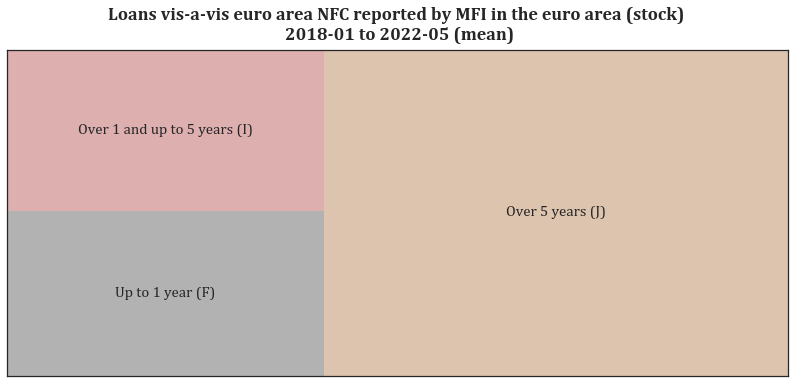

In [18]:
plt.style.use(['seaborn-white'])
plt.rc("font", family="Cambria")

fig, ax = plt.subplots(figsize = (wide,height))
squarify.plot(label=list(df_BSI_merged.columns), sizes=df_BSI_merged.mean(), color = get_colors2(), alpha=.4, text_kwargs={'fontsize':15})
ax.set_title("Loans vis-a-vis euro area NFC reported by MFI in the euro area (stock) \n 2018-01 to 2022-05 (mean)", fontweight="bold", size=titel_fontsize, pad=title_distance)
ax.set_yticklabels([])
ax.set_xticklabels([])
fig.savefig(f'Chart_6.png', dpi=save_dpi, bbox_inches='tight')

### Map of Europe

In [19]:
# Building blocks for the URL
entrypoint = 'https://sdw-wsrest.ecb.europa.eu/service/'
resource = 'data'
flowRef ='BSI'
# Loans vis-a-vis MFI reported by MFI excluding ESCB in Germany (stock)
key_p1 = 'Q.DE.N.A.A20.A.1.'
key_p2 = '.1000.Z01.E'
country_list = ['AT','BE','BG','CY','CZ','DK','EE','ES','FI','FR','GB','GR','HR','HU','IE','IT','LT',
                'LU','LV','MT','NL','PL','PT','RO','SE','SI','SK']

parameters = {
    'startPeriod': '2021-12-31',
    'endPeriod':   '2022-03-31'
}

#### Query of further data from the SDW

In [20]:
df_count_area = pd.DataFrame()

for country in country_list:
    #print(f'{key_p1}{country}{key_p2}')
    # Construct the URL: https://sdw-wsrest.ecb.europa.eu/service/data/EXR/D.CHF.EUR.SP00.A
    request_url = entrypoint + resource + '/'+ flowRef + '/' + key_p1 + country + key_p2
    # Make the HTTP request
    response = requests.get(request_url, params=parameters)
    # Make the HTTP request again, now requesting for CSV format
    response = requests.get(request_url, params=parameters, headers={'Accept': 'text/csv'})
    # Read the response as a file into a Pandas DataFrame
    df_temp = pd.read_csv(io.StringIO(response.text))
    
    df_temp = df_temp.filter(['TIME_PERIOD', 'OBS_VALUE', 'COUNT_AREA'], axis=1)
    
    df_count_area = df_count_area.append(df_temp)
    #print(df)

In [21]:
df_count_area = df_count_area.reset_index(drop=True)

In [22]:
country_dict = {
    'AT' : 'Austria',
    'BE' : 'Belgium',
    'BG' : 'Bulgaria',
    'CY' : 'Cyprus',
    'CZ' : 'Czechia',
    'DK' : 'Denmark',
    'EE' : 'Estonia',
    'ES' : 'Spain',
    'FI' : 'Finland',
    'FR' : 'France',
    'GB' : 'United Kingdom of Great Britain and Northern Ireland',
    'GR' : 'Greece',
    'HR' : 'Croatia',
    'HU' : 'Hungary',
    'IE' : 'Ireland',
    'IT' : 'Italy',
    'LT' : 'Lithuania',
    'LU' : 'Luxembourg',
    'LV' : 'Latvia',
    'MT' : 'Malta',
    'NL' : 'Netherlands',
    'PL' : 'Poland',
    'PT' : 'Portugal',
    'RO' : 'Romania',
    'SE' : 'Sweden',
    'SI' : 'Slovenia',
    'SK' : 'Slovakia'
}

In [23]:
df_count_area['country_name'] = df_count_area['COUNT_AREA'].replace(country_dict)

In [24]:
fig = px.choropleth(df_count_area, geojson=counties, locations='country_name', color='OBS_VALUE',
                           color_continuous_scale="Viridis",
                           range_color=(0, df_count_area['OBS_VALUE'].max()),
                           scope="europe",
                           locationmode = "country names",
                           labels={'OBS_VALUE':'Millions of Euro'},
                           title="Loans vis-a-vis MFI reported by MFI excluding ESCB in Germany (stock) 2022Q1"
                          )
fig.update_geos(fitbounds="locations")
fig.update_layout(height=700, width=800, margin={"r":0,"t":80,"l":0,"b":0})
#plt.savefig(f'Chart_map.png', dpi=save_dpi, bbox_inches='tight')
fig.show()

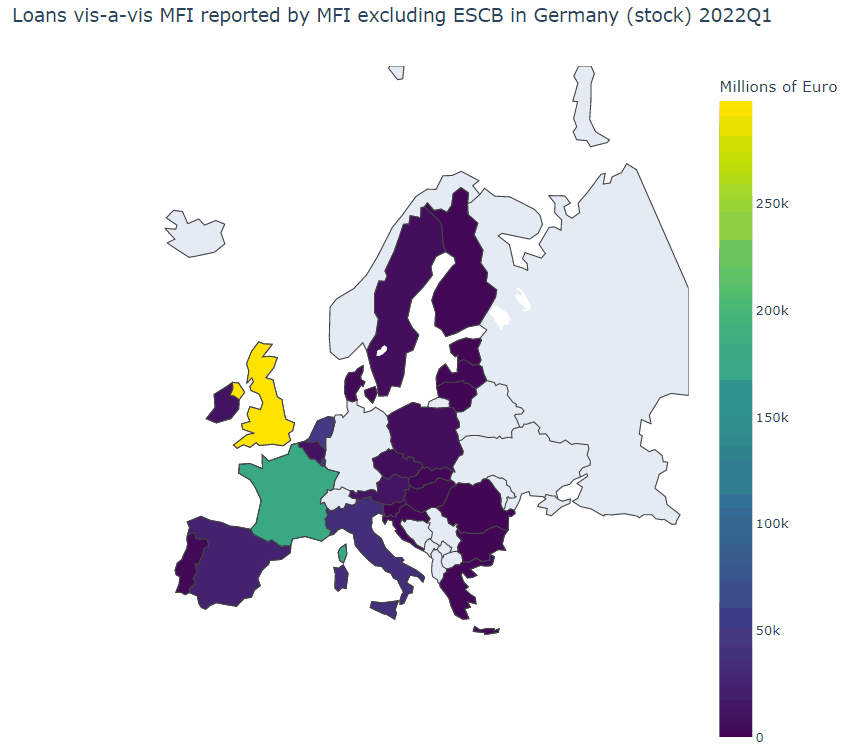

In [25]:
display(Image(filename='Animation.gif'))

### Chord chart

In [26]:
# Building blocks for the URL
entrypoint = 'https://sdw-wsrest.ecb.europa.eu/service/'
resource = 'data'
flowRef ='BSI'
# Loans vis-a-vis MFI reported by MFI excluding ESCB - country to country (selected countries) (stock) - 2021-Q4 
key_p1 = '.N.A.A20.A.1.'
key_p2 = '.1000.Z01.E'
country_list = ['AT','BE','BG','CY','CZ','DK','DE','EE','ES','FI','FR','GB','GR','HR','HU','IE','IT','LT',
                'LU','LV','MT','NL','PL','PT','RO','SE','SI','SK']

parameters = {
    'startPeriod': '2021-09-30',
    'endPeriod':   '2021-12-31'
}

#### Query of further data from the SDW

In [28]:
df_chord = pd.DataFrame()

for country_ref in country_list:
    for country_count in country_list:
        if country_ref != country_count:
            #print(f'Q.{country_ref}{key_p1}{country_count}{key_p2}')
            # Construct the URL: https://sdw-wsrest.ecb.europa.eu/service/data/EXR/D.CHF.EUR.SP00.A
            request_url = entrypoint + resource + '/'+ flowRef + '/Q.' + country_ref + key_p1 + country_count + key_p2
            # Make the HTTP request
            response = requests.get(request_url, params=parameters)
            # Make the HTTP request again, now requesting for CSV format
            response = requests.get(request_url, params=parameters, headers={'Accept': 'text/csv'})
            # Read the response as a file into a Pandas DataFrame
            if response.text != '': 
                df_temp = pd.read_csv(io.StringIO(response.text))

                df_temp = df_temp.filter(['OBS_VALUE','REF_AREA', 'COUNT_AREA'], axis=1)

                df_chord = df_chord.append(df_temp)
                #print(df)

In [29]:
df_chord = df_chord.replace(np.nan,0)

In [30]:
df_chord.head(3)

,OBS_VALUE,REF_AREA,COUNT_AREA
0,416.0,AT,BE
0,0.0,AT,BG
0,0.0,AT,CY


In [31]:
df_chord = df_chord.sort_values(['REF_AREA','COUNT_AREA'])
df_pivot_chord = pd.pivot_table(df_chord, values='OBS_VALUE', index='REF_AREA',
                    columns='COUNT_AREA', aggfunc=np.sum, fill_value=0)

In [32]:
df_pivot_chord = df_pivot_chord[list(df_pivot_chord.index)]
df_pivot_chord = df_pivot_chord.reset_index()
df_pivot_chord = df_pivot_chord.round(0)

In [33]:
col_names = list(df_pivot_chord.columns)
col_names.remove('REF_AREA')

In [34]:
chord_matrix = df_pivot_chord[col_names].to_numpy()

In [35]:
chord_diagram(chord_matrix, col_names, gap=0.03, use_gradient=True, sort="size", directed=False,
              cmap=None, chord_colors=None, rotate_names=False, fontcolor="grey", min_chord_width=1000, show=False, fontsize=7)

plt.savefig(f'Chart_7.png', dpi=save_dpi, bbox_inches='tight')
plt.close()

### Chord-Chart: Loans vis-a-vis MFI reported by MFI excluding ESCB - country to country (selected countries) (stock) - 2021-Q4 

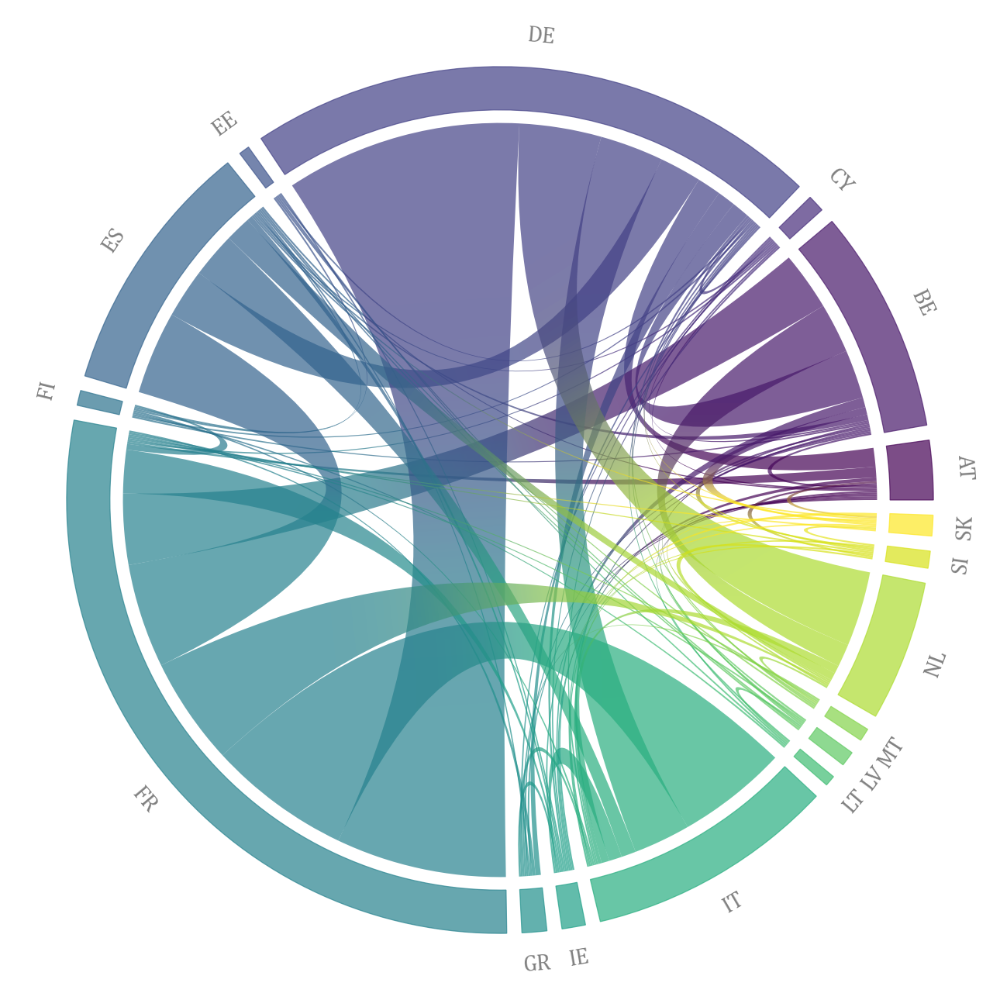

In [36]:
display(Image(filename='Chart_7.png'))

## Data query from the ECB job portal and creating a wordcloud

The following short script is used to retrieve the text of the job advertisement (Research Analyst - Statistics (ESCB/IO)), process it and create a word cloud (size = number of terms stemmed)

#### Data query from the website

Source: https://matix.io/extract-text-from-webpage-using-beautifulsoup-and-python/ (Customized)

In [37]:
# retrieval of the information of the website

url = 'https://talent.ecb.europa.eu/careers/JobDetail?jobId=5856'
res = requests.get(url)
html_page = res.content
soup = BeautifulSoup(html_page, 'html.parser')
text = soup.find_all(text=True)

output = ''
blacklist = ['[document]','a','article','aside','body','footer','h4','head','header','html',
             'label','link','main','meta','p','script','section','ul']

for t in text:
    if t.parent.name not in blacklist:
        output += '{} '.format(t)

#### Data processing (stopwords, stemming, removing special characters, counting)

In [38]:
# Removing stopwords
output = ' '.join([word for word in output.split() if word not in (stopwords.words('english'))])

In [39]:
print(f'{output[:1000]}...')

Research Analyst - Statistics (ESCB/IO) - - 5856 Research Analyst - Statistics (ESCB/IO) Knowledge, Information, Data&Statistics Statistics 5856 General Information Type contract Short-term contract, may extended 36 months subject individual performance organisational needs Contract end date 31.12.2024 Who apply? EU nationals working national central banks ESCB, international governmental organisations employers performing central banking banking supervision tasks. Salary E/F (1) (minimum full time monthly net salary €5424 benefits, see information section) Role specialisation Datasets Statistics Working time Full time Place work Frankfurt Main, Germany Closing date 13.07.2022 Your team You part Monetary Statistics Section Directorate General Statistics. Our Directorate General around 300 staff providing macroeconomic statistics, granular financial data supervisory data policymaking microprudential supervision. We currently working implementing new system based state-of-the-art technol

In [40]:
# remove (punctuation, numbers, special characters)
special = "1234567890!#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~©€"

for i in list(special):
    output = output.replace(i,' ')
    output = output.replace('  ',' ')

In [41]:
output = output.lower()
word_list = output.split()

In [42]:
#Stemming of every single word
stemmed_word_list = []

for y in word_list:
    stemmed_word_list.append(stemmer.stem(y))

In [43]:
# Removing additional superfluous words
remove = ['the','of','you','as','e']
for i in remove:
    while i in stemmed_word_list:
        stemmed_word_list.remove(i)  

In [44]:
stemmed_word_list[:10]

['research',
 'analyst',
 'statist',
 'escb',
 'io',
 'research',
 'analyst',
 'statist',
 'escb',
 'io']

In [45]:
# Counting the frequency of the words (stemmed)

word_count = pd.value_counts(np.array(stemmed_word_list))
word_count_df = pd.DataFrame(word_count)

In [46]:
word_count_df.head(5)

,0
statist,17
posit,7
work,7
inform,6
ecb,5


### WordCloud

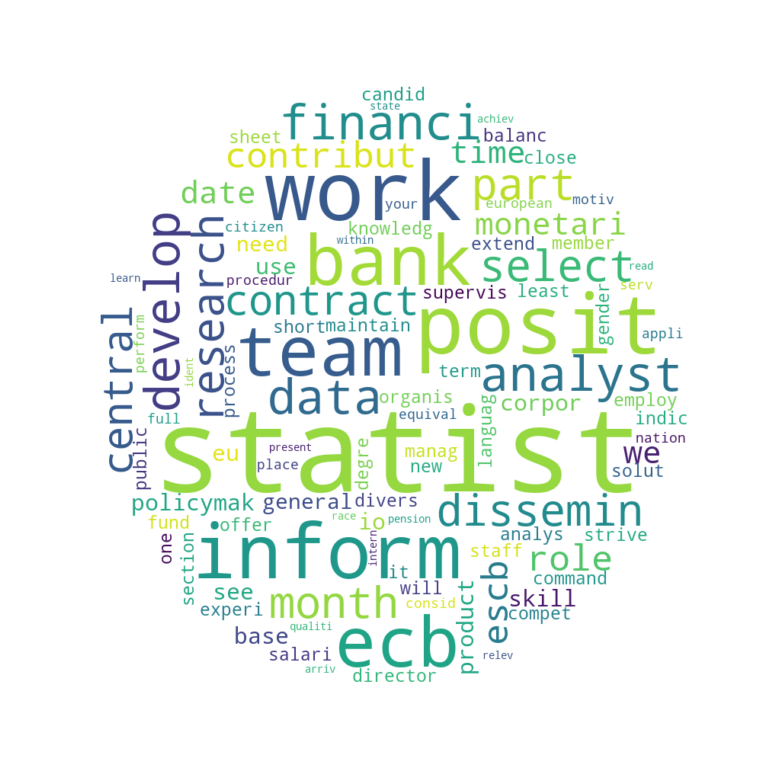

In [47]:
#creating a round word cloud of the stemmed words
x, y = np.ogrid[:1000, :1000]

mask = (x - 500) ** 2 + (y - 500) ** 2 > 400 ** 2
mask = 255 * mask.astype(int)

data = word_count_df.to_dict()[0]
wordcloud = WordCloud(background_color="white", width=800, height=400, max_words=100, mask=mask).generate_from_frequencies(data)

plt.figure(figsize=(14, 14))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()